In [5]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns  
import os
from imblearn.under_sampling import TomekLinks
from sklearn.preprocessing import LabelEncoder,StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.metrics import classification_report 
from sklearn.model_selection import train_test_split 
import pandas as pd 
from sklearn.ensemble import RandomForestClassifier 
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV 
from sklearn.preprocessing import MinMaxScaler, OrdinalEncoder, OneHotEncoder
from imblearn.under_sampling import ClusterCentroids
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from catboost import CatBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import TomekLinks
from imblearn.pipeline import Pipeline, make_pipeline
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.preprocessing import MinMaxScaler, OrdinalEncoder, OneHotEncoder
from sklearn.model_selection import train_test_split, cross_val_score
import warnings
warnings.filterwarnings("ignore")
from sklearn.preprocessing import MinMaxScaler, OrdinalEncoder, OneHotEncoder
from imblearn.over_sampling import ADASYN
from imblearn.under_sampling import EditedNearestNeighbours


In [6]:
H = pd.read_csv('train.csv/train.csv')
HT = pd.read_csv('test.csv/test.csv')

In [7]:
for i in H.columns:
    print(f'======== {i} ========\n')
    print(H[i].value_counts().sort_values(ascending=False))
    print('- - ' * 20)

======== Employee ID ========

Employee ID
8410     1
9063     1
6885     1
4098     1
65251    1
        ..
60264    1
44132    1
37195    1
6266     1
15796    1
Name: count, Length: 59598, dtype: int64
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
======== Age ========

Age
34    1501
47    1493
40    1475
39    1470
38    1470
49    1469
45    1463
53    1457
55    1456
59    1454
30    1450
43    1449
41    1442
46    1435
20    1432
35    1428
22    1426
36    1425
42    1425
26    1421
58    1415
25    1413
21    1413
27    1410
19    1410
33    1406
56    1403
32    1398
44    1397
54    1393
50    1392
48    1387
57    1386
28    1384
24    1384
37    1382
23    1379
51    1369
52    1366
31    1366
29    1358
18    1346
Name: count, dtype: int64
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
======== Gender ========

Gender
Male      32739
Female    26859
Name: count, dtype: int64
- - - - - - - - - - - - - -

In [ ]:
H.shape

(59598, 24)

In [ ]:
H.head()

,Employee ID,Age,Gender,Years at Company,Job Role,Monthly Income,Work-Life Balance,Job Satisfaction,Performance Rating,Number of Promotions,...,Number of Dependents,Job Level,Company Size,Company Tenure,Remote Work,Leadership Opportunities,Innovation Opportunities,Company Reputation,Employee Recognition,Attrition
0,8410,31,Male,19,Education,5390,Excellent,Medium,Average,2,...,0,Mid,Medium,89,No,No,No,Excellent,Medium,Stayed
1,64756,59,Female,4,Media,5534,Poor,High,Low,3,...,3,Mid,Medium,21,No,No,No,Fair,Low,Stayed
2,30257,24,Female,10,Healthcare,8159,Good,High,Low,0,...,3,Mid,Medium,74,No,No,No,Poor,Low,Stayed
3,65791,36,Female,7,Education,3989,Good,High,High,1,...,2,Mid,Small,50,Yes,No,No,Good,Medium,Stayed
4,65026,56,Male,41,Education,4821,Fair,Very High,Average,0,...,0,Senior,Medium,68,No,No,No,Fair,Medium,Stayed


In [ ]:
H.tail()

,Employee ID,Age,Gender,Years at Company,Job Role,Monthly Income,Work-Life Balance,Job Satisfaction,Performance Rating,Number of Promotions,...,Number of Dependents,Job Level,Company Size,Company Tenure,Remote Work,Leadership Opportunities,Innovation Opportunities,Company Reputation,Employee Recognition,Attrition
59593,37195,50,Female,12,Education,4414,Fair,High,Average,1,...,2,Senior,Small,35,No,No,Yes,Poor,Very High,Left
59594,6266,18,Male,4,Healthcare,8040,Fair,High,High,3,...,0,Senior,Medium,73,No,No,No,Fair,Medium,Left
59595,54887,22,Female,14,Technology,7944,Fair,High,High,0,...,2,Entry,Small,29,No,Yes,No,Good,Medium,Stayed
59596,861,23,Male,8,Education,2931,Fair,Very High,Average,0,...,0,Entry,Large,9,No,No,No,Good,Low,Left
59597,15796,56,Male,19,Technology,6660,Good,High,Average,0,...,3,Mid,Medium,81,No,No,No,Good,Low,Stayed


In [ ]:
H.corr(numeric_only=True)

,Employee ID,Age,Years at Company,Monthly Income,Number of Promotions,Distance from Home,Number of Dependents,Company Tenure
Employee ID,1.000000,0.000002,-0.001162,0.003070,0.004362,0.009354,-0.005556,-0.001469
Age,0.000002,1.000000,0.539806,-0.001989,0.000167,-0.007063,0.002927,0.237048
Years at Company,-0.001162,0.539806,1.000000,-0.005288,-0.000229,-0.006888,0.003973,0.442180
Monthly Income,0.003070,-0.001989,-0.005288,1.000000,0.006418,-0.002528,0.002582,-0.005397
Number of Promotions,0.004362,0.000167,-0.000229,0.006418,1.000000,-0.007882,-0.000558,0.003903
Distance from Home,0.009354,-0.007063,-0.006888,-0.002528,-0.007882,1.000000,0.000659,-0.005595
Number of Dependents,-0.005556,0.002927,0.003973,0.002582,-0.000558,0.000659,1.000000,0.001600
Company Tenure,-0.001469,0.237048,0.442180,-0.005397,0.003903,-0.005595,0.001600,1.000000


In [ ]:
H.dtypes

Employee ID                  int64
Age                          int64
Gender                      object
Years at Company             int64
Job Role                    object
Monthly Income               int64
Work-Life Balance           object
Job Satisfaction            object
Performance Rating          object
Number of Promotions         int64
Overtime                    object
Distance from Home           int64
Education Level             object
Marital Status              object
Number of Dependents         int64
Job Level                   object
Company Size                object
Company Tenure               int64
Remote Work                 object
Leadership Opportunities    object
Innovation Opportunities    object
Company Reputation          object
Employee Recognition        object
Attrition                   object
dtype: object

In [ ]:
H.isnull().sum()


Employee ID                 0
Age                         0
Gender                      0
Years at Company            0
Job Role                    0
Monthly Income              0
Work-Life Balance           0
Job Satisfaction            0
Performance Rating          0
Number of Promotions        0
Overtime                    0
Distance from Home          0
Education Level             0
Marital Status              0
Number of Dependents        0
Job Level                   0
Company Size                0
Company Tenure              0
Remote Work                 0
Leadership Opportunities    0
Innovation Opportunities    0
Company Reputation          0
Employee Recognition        0
Attrition                   0
dtype: int64

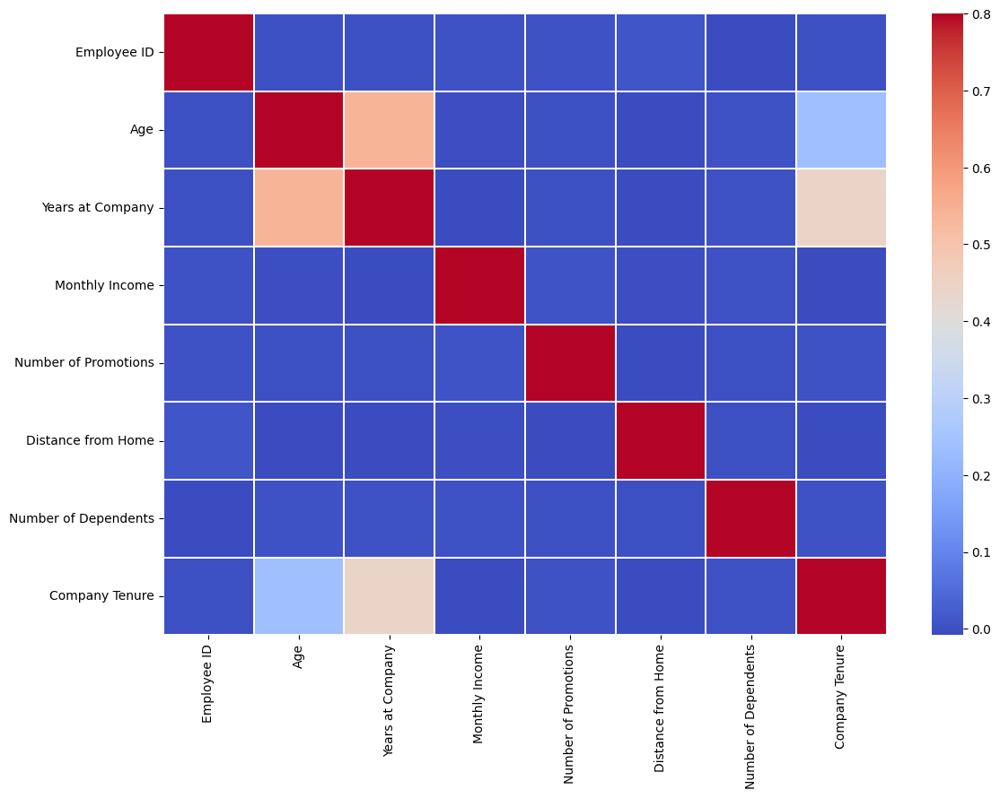

In [ ]:
plt.figure(figsize=(13,9))
sns.heatmap(H.corr(numeric_only=True),vmax=0.8,linewidth=0.1,cmap='coolwarm')
plt.show()

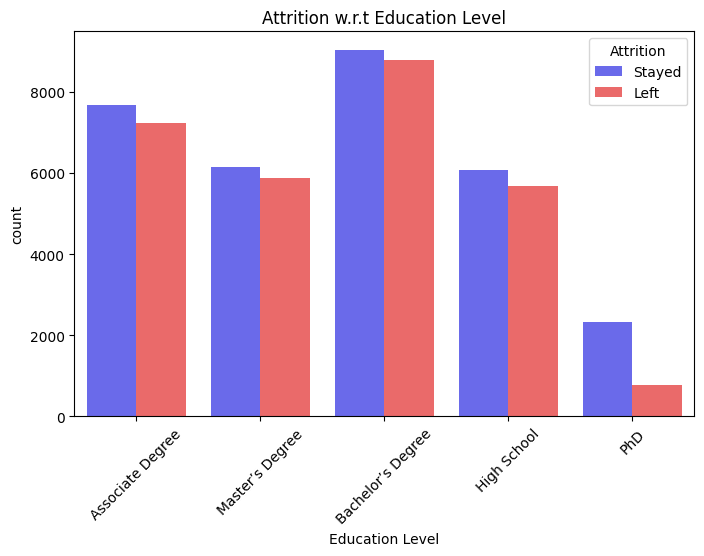

In [ ]:
plt.figure(figsize=(8,5))
sns.countplot(x='Education Level',hue='Attrition', data=H, palette='seismic')
plt.title("Attrition w.r.t Education Level")
plt.xticks(rotation=45)
plt.show()

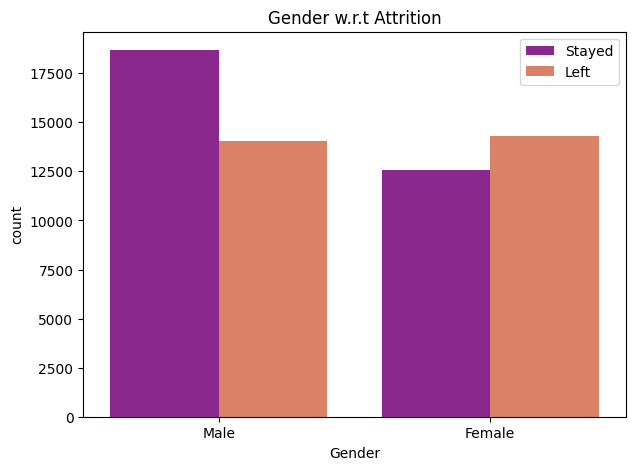

In [ ]:
plt.figure(figsize=(7,5))
sns.countplot(x='Gender',hue='Attrition', data=H, palette='plasma')
plt.title("Gender w.r.t Attrition")
plt.legend(loc='best')
plt.show()

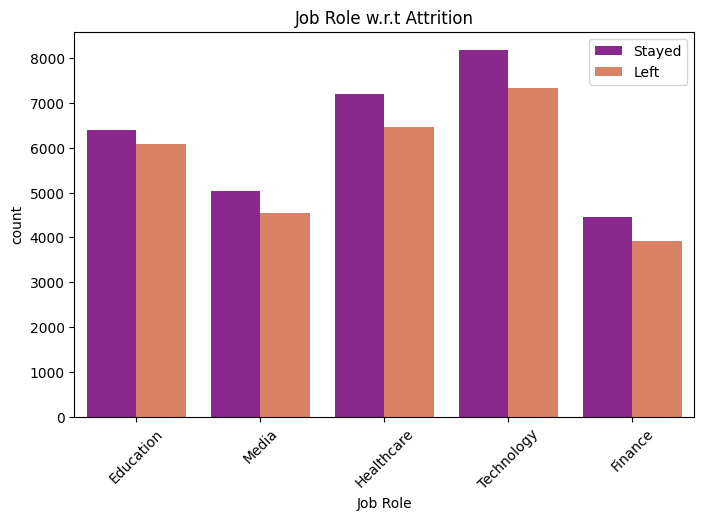

In [ ]:
plt.figure(figsize=(8,5))
sns.countplot(x='Job Role',hue='Attrition', data=H, palette='plasma')
plt.title("Job Role w.r.t Attrition")
plt.legend(loc='best')
plt.xticks(rotation=45)
plt.show()

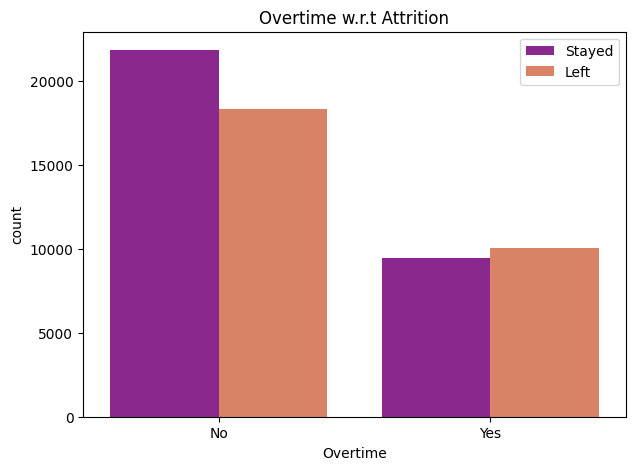

In [ ]:
plt.figure(figsize=(7,5))
sns.countplot(x='Overtime',hue='Attrition', data=H, palette='plasma')
plt.title("Overtime w.r.t Attrition")
plt.legend(loc='best')
plt.show()

In [ ]:
import  plotly.express as px
fig = px.pie(H, names = 'Attrition', title = 'Target Variable: Attrition', template = 'plotly_dark')
fig.update_traces(rotation=90, pull = [0.1], textinfo = "percent+label")
fig.show()

In [ ]:
Attrition = H.query("Attrition == 'Stayed'")
def barplot(i):
    fig = px.histogram(Attrition, x = Attrition[i], template = 'plotly_dark',
                      title = f'Attrition x {i}', text_auto = 'd3-format')
    fig.show()

In [ ]:
barplot('Years at Company')
barplot('Education Level')
barplot('Gender')
barplot('Monthly Income')
barplot('Job Satisfaction')
barplot('Work-Life Balance')
barplot('Performance Rating')
barplot('Job Role')
barplot('Marital Status')
barplot('Distance from Home')
barplot('Job Level')
barplot('Company Size')
barplot('Company Tenure')
barplot('Employee Recognition')
barplot('Innovation Opportunities')
barplot('Number of Dependents')
barplot('Leadership Opportunities')
barplot('Overtime')

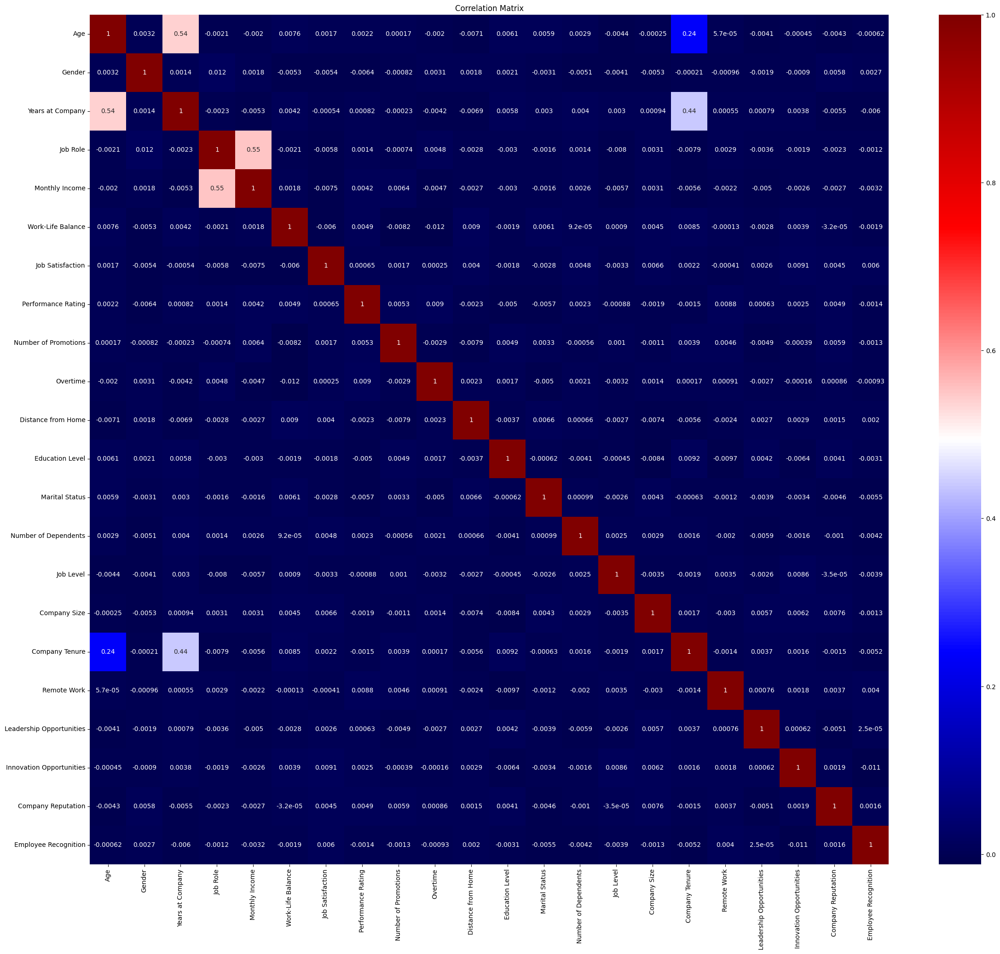

In [ ]:
plt.figure(figsize=(28, 24))
corr_matrix = x_scaled.corr()
sns.heatmap(corr_matrix, annot=True, cmap='seismic')
plt.title('Correlation Matrix')
plt.show()

<Axes: xlabel='Monthly Income', ylabel='Density'>

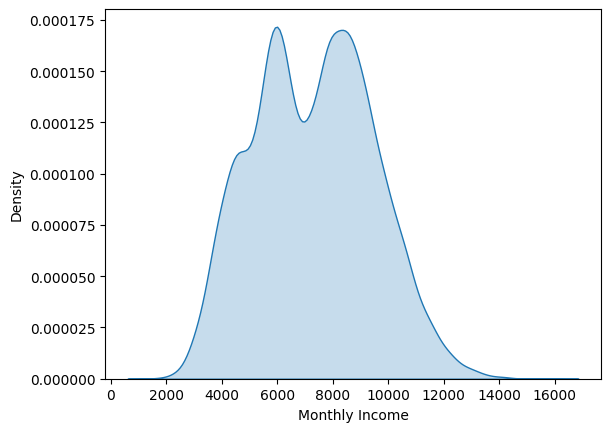

In [ ]:
sns.kdeplot(data=H,x="Monthly Income",fill=True)

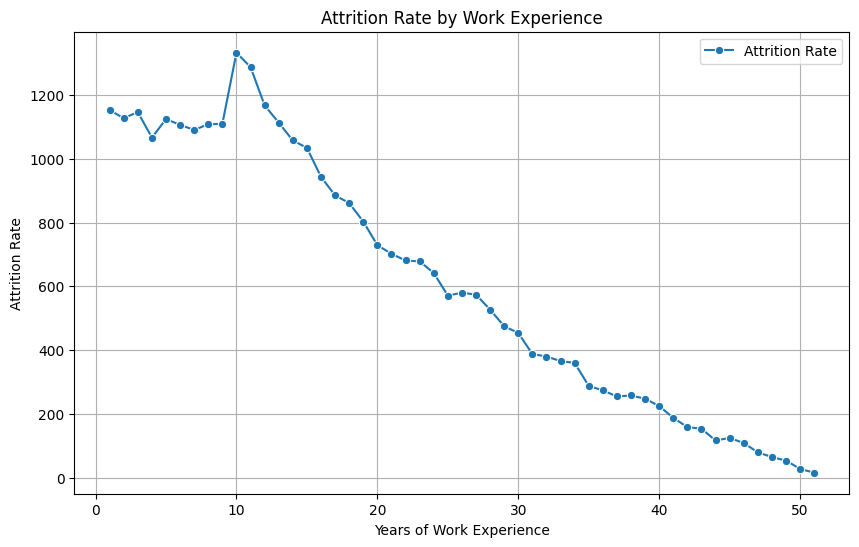

In [11]:
attrition_data = H[H['Attrition'] == 'Stayed']
attrition_rates = attrition_data.groupby('Years at Company')['Attrition'].value_counts().unstack()
plt.figure(figsize=(10, 6))
sns.lineplot(data=attrition_rates.reset_index(), x='Years at Company', y='Stayed', marker='o', label='Attrition Rate')
plt.title('Attrition Rate by Work Experience')
plt.xlabel('Years of Work Experience')
plt.ylabel('Attrition Rate')
plt.legend()
plt.grid(True)
plt.show()

<Axes: title={'center': 'Salary with Age'}, xlabel='Monthly Income', ylabel='Age'>

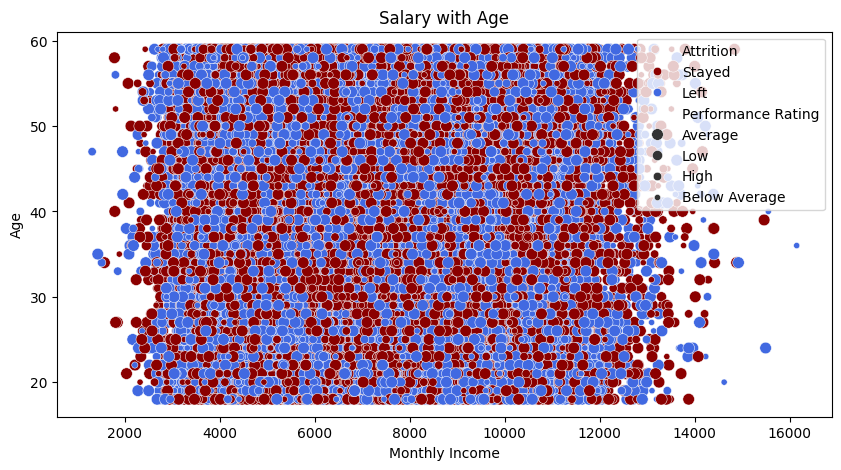

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Salary with Age")
sns.scatterplot(data=H,x="Monthly Income",y="Age",hue="Attrition", size="Performance Rating",sizes=(20, 70), legend="full",palette=["#8B0000","#4169E1"])

Text(0.5, 1.0, 'Ratio between Income and HourlyRate')

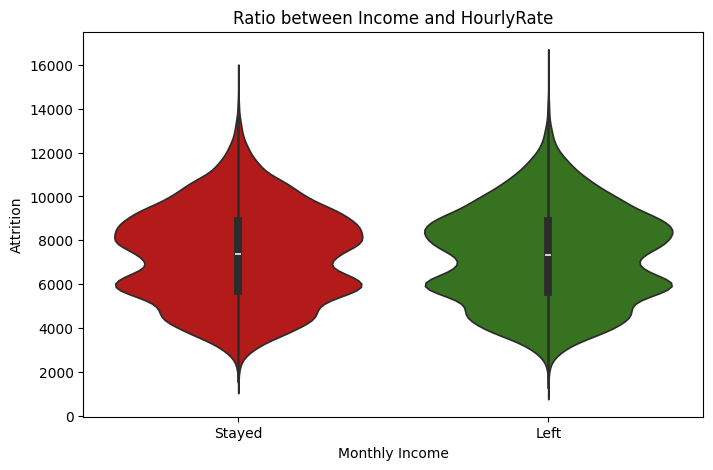

In [ ]:
plt.figure(figsize = (8,5))
sns.violinplot(x= H['Attrition'] ,y =H['Monthly Income'],palette=["#CD0000","#308014"] )
plt.ylabel('Attrition')
plt.xlabel('Monthly Income')
plt.title("Ratio between Income and HourlyRate")

Text(0.5, 1.0, 'Ratio between Income and HourlyRate')

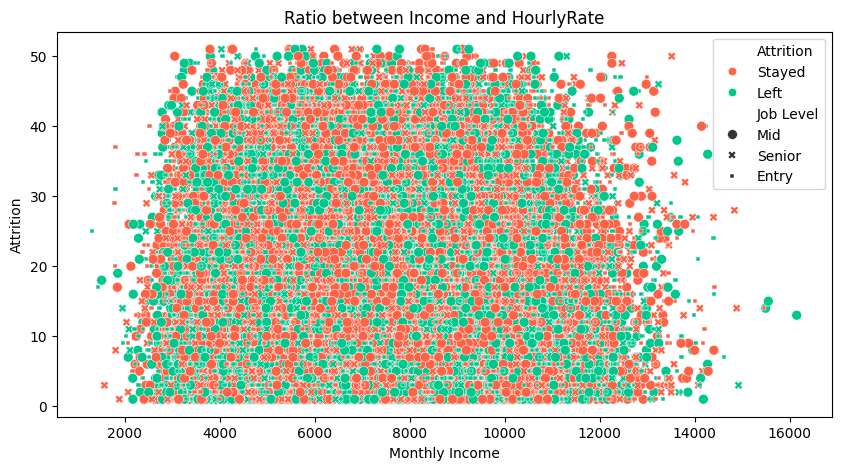

In [ ]:
plt.figure(figsize = (10,5))
sns.scatterplot(data=H,x='Monthly Income',y='Years at Company',hue="Attrition",style="Job Level",size="Job Level",palette=["#FF6347","#00C78C"],sizes=(20,50))
plt.ylabel('Attrition')
plt.xlabel('Monthly Income')
plt.title("Ratio between Income and HourlyRate")

<Axes: xlabel='Age', ylabel='Monthly Income'>

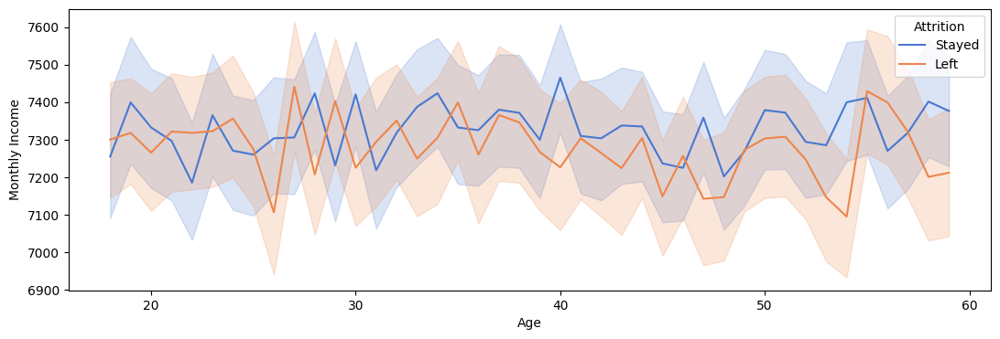

In [ ]:
plt.figure(figsize=(13,4))
sns.lineplot(data=H,x='Age',y='Monthly Income',hue="Attrition", palette='muted')

In [ ]:
overtime_counts = H.groupby('Overtime')['Attrition'].value_counts().to_frame()
sizes = overtime_counts.values
labels = overtime_counts.index
labels = [labels[2][1], labels[3][1]]
overtime_counts

count
Overtime Attrition       
No       Stayed     21835
         Left       18313
Yes      Left       10025
         Stayed      9425

In [ ]:
H.groupby('Work-Life Balance')['Attrition'].value_counts().to_frame()

count
Work-Life Balance Attrition       
Excellent         Stayed      6880
                  Left        3839
Fair              Left       10370
                  Stayed      7676
Good              Stayed     13391
                  Left        9137
Poor              Left        4992
                  Stayed      3313

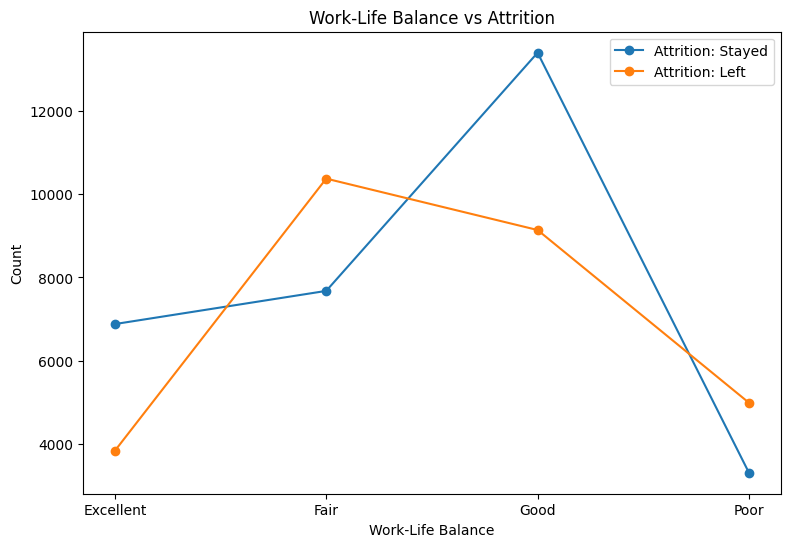

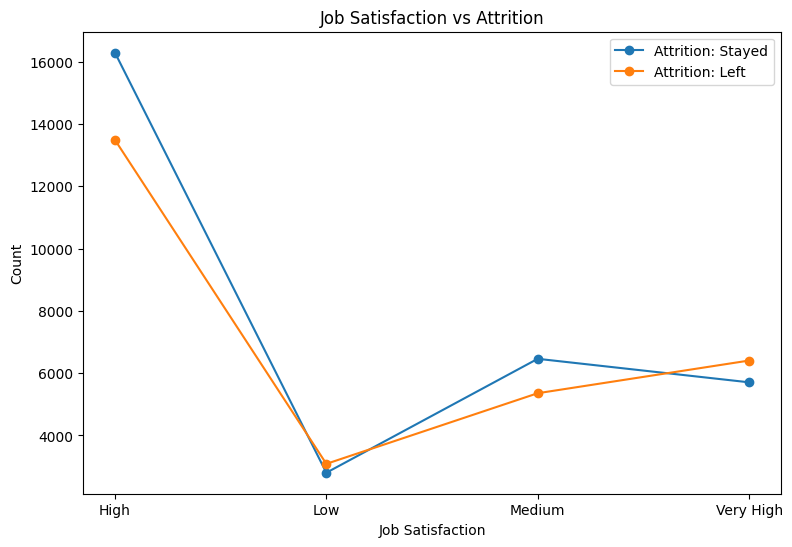

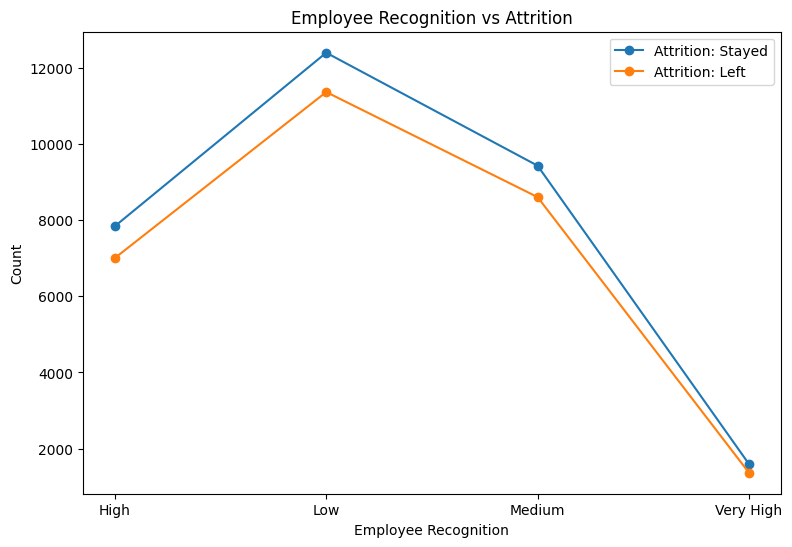

In [ ]:
#How does self Job Satisfaction impact the Attrition?¶
factors = ['Work-Life Balance', 'Job Satisfaction', 'Employee Recognition']

for factor in factors:
    plt.figure(figsize=(9, 6))
    for attrition_category in H['Attrition'].unique():
        data_attrition = H[H['Attrition'] == attrition_category]
        plt.plot(
            data_attrition.groupby(factor).size().index,
            data_attrition.groupby(factor).size().values,
            marker='o',
            label=f'Attrition: {attrition_category}'
        )
    
    plt.title(f'{factor} vs Attrition')
    plt.xlabel(factor)
    plt.ylabel('Count')
    plt.legend()
    plt.show()

In [ ]:
categorical_features = H.select_dtypes(include=[object]).columns
print("total categorical_features",len(categorical_features))
H[categorical_features].head()

total categorical_features 16


,Gender,Job Role,Work-Life Balance,Job Satisfaction,Performance Rating,Overtime,Education Level,Marital Status,Job Level,Company Size,Remote Work,Leadership Opportunities,Innovation Opportunities,Company Reputation,Employee Recognition,Attrition
0,Male,Education,Excellent,Medium,Average,No,Associate Degree,Married,Mid,Medium,No,No,No,Excellent,Medium,Stayed
1,Female,Media,Poor,High,Low,No,Master’s Degree,Divorced,Mid,Medium,No,No,No,Fair,Low,Stayed
2,Female,Healthcare,Good,High,Low,No,Bachelor’s Degree,Married,Mid,Medium,No,No,No,Poor,Low,Stayed
3,Female,Education,Good,High,High,No,High School,Single,Mid,Small,Yes,No,No,Good,Medium,Stayed
4,Male,Education,Fair,Very High,Average,Yes,High School,Divorced,Senior,Medium,No,No,No,Fair,Medium,Stayed


In [ ]:
numerical_features = [feature for feature in H.columns if H[feature].dtype != 'O']
print("Total numerical_features", len(numerical_features))
H[numerical_features].head()

Total numerical_features 8


,Employee ID,Age,Years at Company,Monthly Income,Number of Promotions,Distance from Home,Number of Dependents,Company Tenure
0,8410,31,19,5390,2,22,0,89
1,64756,59,4,5534,3,21,3,21
2,30257,24,10,8159,0,11,3,74
3,65791,36,7,3989,1,27,2,50
4,65026,56,41,4821,0,71,0,68


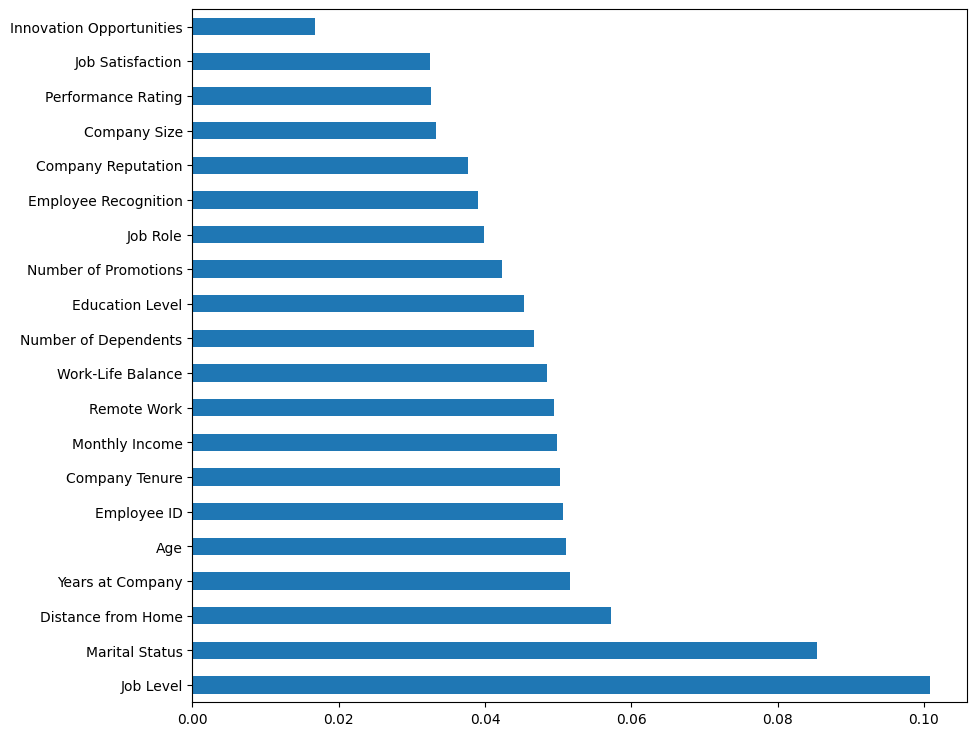

In [ ]:
#RANDOM FOREST
plt.figure(figsize=(10,9))
feature_importance.nlargest(20).plot(kind='barh')
plt.show()

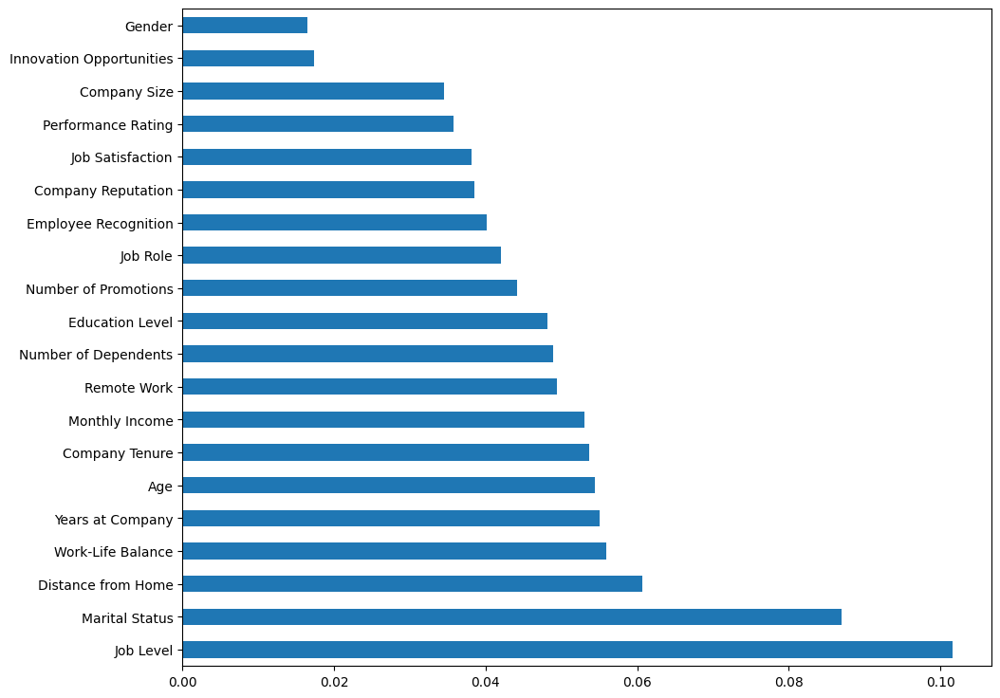

In [ ]:
extra_tree = ExtraTreesClassifier()

extra_tree.fit(X_train,y_train)

feat_importance = extra_tree.feature_importances_

plt.figure(figsize=(11,9))
feat_imp = pd.Series(extra_tree.feature_importances_, index=X_train.columns)

feat_imp.nlargest(20).plot(kind='barh')
plt.show()

## DATA PREPROCESSING

In [ ]:
H1 = H.drop(columns=['Employee ID'])
H2 = HT.drop(columns=['Employee ID'])
ordinal_mappings = {
    'Work-Life Balance': {'Poor': 1, 'Fair': 2, 'Good': 3, 'Excellent': 4},
    'Job Satisfaction': {'Low': 1, 'Medium': 2, 'High': 3, 'Very High': 4},
    'Performance Rating': {'Low': 1, 'Below Average': 2, 'Average': 3, 'High': 4},
    'Education Level': {'High School': 1, 'Associate Degree': 2, 'Bachelor’s Degree': 3, 'Master’s Degree': 4, 'PhD': 5},
    'Job Level': {'Entry': 1, 'Mid': 2, 'Senior': 3},
    'Company Reputation': {'Poor': 1, 'Fair': 2, 'Good': 3, 'Excellent': 4},
    'Employee Recognition': {'Low': 1, 'Medium': 2, 'High': 3, 'Very High': 4},
    'Company Size' : {'Small': 1, 'Medium': 2, 'Large': 3}
}

for col, mapping in ordinal_mappings.items():
    H1[col] = H1[col].map(mapping)
for col, mapping in ordinal_mappings.items():
    H2[col] = H2[col].map(mapping)

binary_columns = ['Remote Work', 'Leadership Opportunities', 'Innovation Opportunities', 'Attrition', 'Overtime', 'Gender']

binary_mapping = {'No': 0, 'Yes': 1, 'Stayed': 0, 'Left': 1, 'Male': 0, 'Female': 1}

for col in binary_columns:
    H1[col] = H1[col].map(binary_mapping)
for col in binary_columns:
    H2[col] = H2[col].map(binary_mapping)

H1

,Age,Gender,Years at Company,Job Role,Monthly Income,Work-Life Balance,Job Satisfaction,Performance Rating,Number of Promotions,Overtime,...,Number of Dependents,Job Level,Company Size,Company Tenure,Remote Work,Leadership Opportunities,Innovation Opportunities,Company Reputation,Employee Recognition,Attrition
0,31,0,19,Education,5390,4,2,3,2,0,...,0,2,2,89,0,0,0,4,2,0
1,59,1,4,Media,5534,1,3,1,3,0,...,3,2,2,21,0,0,0,2,1,0
2,24,1,10,Healthcare,8159,3,3,1,0,0,...,3,2,2,74,0,0,0,1,1,0
3,36,1,7,Education,3989,3,3,4,1,0,...,2,2,1,50,1,0,0,3,2,0
4,56,0,41,Education,4821,2,4,3,0,1,...,0,3,2,68,0,0,0,2,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59593,50,1,12,Education,4414,2,3,3,1,1,...,2,3,1,35,0,0,1,1,4,1
59594,18,0,4,Healthcare,8040,2,3,4,3,0,...,0,3,2,73,0,0,0,2,2,1
59595,22,1,14,Technology,7944,2,3,4,0,1,...,2,1,1,29,0,1,0,3,2,0
59596,23,0,8,Education,2931,2,4,3,0,0,...,0,1,3,9,0,0,0,3,1,1


In [ ]:
X_train = H1.drop('Attrition', axis = 1)
y_train = H1.Attrition
x_test = H2.drop('Attrition', axis = 1)
y_test = H2.Attrition


In [ ]:
OHE = OneHotEncoder(handle_unknown = 'ignore')
columns_OHE = ['Job Role', 'Marital Status']
X_train_cols = pd.DataFrame(OHE.fit_transform(X_train[columns_OHE]))
X_test_cols = pd.DataFrame(OHE.transform(x_test[columns_OHE]))

X_train_cols.index = X_train.index
X_test_cols.index = x_test.index

num_X_train = X_train.drop([col for col in X_train.columns if X_train[col].dtype == "object"], axis = 1)
num_X_test = x_test.drop([col for col in x_test.columns if x_test[col].dtype == "object"], axis = 1)

X_train = pd.concat([num_X_train,X_train_cols ],axis = 1)
X_test = pd.concat([num_X_test, X_test_cols], axis = 1)
X_train

,Age,Gender,Years at Company,Monthly Income,Work-Life Balance,Job Satisfaction,Performance Rating,Number of Promotions,Overtime,Distance from Home,...,Number of Dependents,Job Level,Company Size,Company Tenure,Remote Work,Leadership Opportunities,Innovation Opportunities,Company Reputation,Employee Recognition,0
0,31,0,19,5390,4,2,3,2,0,22,...,0,2,2,89,0,0,0,4,2,"(0, 0)\t1.0\n (0, 6)\t1.0"
1,59,1,4,5534,1,3,1,3,0,21,...,3,2,2,21,0,0,0,2,1,"(0, 3)\t1.0\n (0, 5)\t1.0"
2,24,1,10,8159,3,3,1,0,0,11,...,3,2,2,74,0,0,0,1,1,"(0, 2)\t1.0\n (0, 6)\t1.0"
3,36,1,7,3989,3,3,4,1,0,27,...,2,2,1,50,1,0,0,3,2,"(0, 0)\t1.0\n (0, 7)\t1.0"
4,56,0,41,4821,2,4,3,0,1,71,...,0,3,2,68,0,0,0,2,2,"(0, 0)\t1.0\n (0, 5)\t1.0"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59593,50,1,12,4414,2,3,3,1,1,66,...,2,3,1,35,0,0,1,1,4,"(0, 0)\t1.0\n (0, 7)\t1.0"
59594,18,0,4,8040,2,3,4,3,0,42,...,0,3,2,73,0,0,0,2,2,"(0, 2)\t1.0\n (0, 7)\t1.0"
59595,22,1,14,7944,2,3,4,0,1,34,...,2,1,1,29,0,1,0,3,2,"(0, 4)\t1.0\n (0, 6)\t1.0"
59596,23,0,8,2931,2,4,3,0,0,62,...,0,1,3,9,0,0,0,3,1,"(0, 0)\t1.0\n (0, 7)\t1.0"


In [ ]:
print('X train size: ', len(X_train))
print('X test size: ', len(x_test))
print('y train size: ', len(y_train))
print('y test size: ', len(y_test))

X train size:  59598
X test size:  14900
y train size:  59598
y test size:  14900


In [ ]:
for column in H1.columns:
    if H1[column].dtype == np.number:
        continue
    H1[column] = LabelEncoder().fit_transform(H1[column])
for column in H2.columns:
    if H2[column].dtype == np.number:
        continue
    H2[column] = LabelEncoder().fit_transform(H2[column])    
X_train = H1.drop('Attrition', axis = 1)
y_train = H1.Attrition
x_test = H2.drop('Attrition', axis = 1)
y_test = H2.Attrition

In [ ]:
scaler = MinMaxScaler()

In [ ]:
smote = SMOTE(random_state=42)
X_train, y_train = smote.fit_resample(X_train, y_train)
X_train

,Age,Gender,Years at Company,Job Role,Monthly Income,Work-Life Balance,Job Satisfaction,Performance Rating,Number of Promotions,Overtime,...,Marital Status,Number of Dependents,Job Level,Company Size,Company Tenure,Remote Work,Leadership Opportunities,Innovation Opportunities,Company Reputation,Employee Recognition
0,13,0,18,0,2611,3,1,2,2,0,...,1,0,1,1,87,0,0,0,3,1
1,41,1,3,3,2755,0,2,0,3,0,...,0,3,1,1,19,0,0,0,1,0
2,6,1,9,2,5380,2,2,0,0,0,...,1,3,1,1,72,0,0,0,0,0
3,18,1,6,0,1212,2,2,3,1,0,...,2,2,1,0,48,1,0,0,2,1
4,38,0,40,0,2042,1,3,2,0,1,...,0,0,2,1,66,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62515,9,1,6,1,4558,0,0,2,0,0,...,0,1,1,0,75,0,0,0,2,0
62516,12,0,11,2,5414,1,2,2,0,0,...,0,0,0,1,42,0,0,0,1,2
62517,23,0,27,0,2800,1,1,2,0,0,...,2,1,1,1,87,0,0,0,1,1
62518,30,0,5,0,1922,1,1,1,0,0,...,0,1,1,0,77,0,0,1,2,0


In [ ]:
ada = ADASYN(random_state=42)
X_train, y_train = ada.fit_resample(X_train, y_train)
print('Resampled dataset after ADASYN shape %s' % y_train)

Resampled dataset after ADASYN shape 0        0
1        0
2        0
3        0
4        0
        ..
62515    1
62516    1
62517    1
62518    1
62519    1
Name: Attrition, Length: 62520, dtype: int64


In [ ]:
rus = RandomUnderSampler(random_state=42)
X_train, y_train = rus.fit_resample(X_train, y_train)  
X_train       

,Age,Gender,Years at Company,Job Role,Monthly Income,Work-Life Balance,Job Satisfaction,Performance Rating,Number of Promotions,Overtime,...,Marital Status,Number of Dependents,Job Level,Company Size,Company Tenure,Remote Work,Leadership Opportunities,Innovation Opportunities,Company Reputation,Employee Recognition
0,13,0,18,0,2611,3,1,2,2,0,...,1,0,1,1,87,0,0,0,3,1
1,41,1,3,3,2755,0,2,0,3,0,...,0,3,1,1,19,0,0,0,1,0
2,6,1,9,2,5380,2,2,0,0,0,...,1,3,1,1,72,0,0,0,0,0
3,18,1,6,0,1212,2,2,3,1,0,...,2,2,1,0,48,1,0,0,2,1
4,38,0,40,0,2042,1,3,2,0,1,...,0,0,2,1,66,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61062,26,0,6,3,3055,1,0,1,1,0,...,1,1,1,0,23,0,0,0,2,1
11355,8,0,17,1,5476,2,2,3,0,0,...,2,3,0,2,87,1,0,0,2,0
1793,23,0,19,0,1435,1,3,2,1,0,...,2,0,0,0,30,0,0,0,1,1
33265,17,0,24,2,5623,2,2,1,0,0,...,1,2,1,0,41,0,0,0,0,1


In [ ]:
enn = EditedNearestNeighbours()
X_train, y_train = enn.fit_resample(X_train, y_train)
print('Resampled dataset after ENN shape %s' % y_train)

Resampled dataset after ENN shape 0        0
1        0
2        0
3        0
4        0
        ..
37089    1
37090    1
37091    1
37092    1
37093    1
Name: Attrition, Length: 37094, dtype: int64


In [ ]:
from imblearn.under_sampling import ClusterCentroids
cc = ClusterCentroids(random_state=42)
X_resampled, y_resampled = cc.fit_resample(X_train, y_train)    
X_resampled   

,Age,Gender,Years at Company,Job Role,Monthly Income,Work-Life Balance,Job Satisfaction,Performance Rating,Number of Promotions,Overtime,...,Marital Status,Number of Dependents,Job Level,Company Size,Company Tenure,Remote Work,Leadership Opportunities,Innovation Opportunities,Company Reputation,Employee Recognition
0,30,0,12,1,3000,1,2,2,0,1,...,1,0,1,0,72,0,0,0,1,0
1,23,0,8,2,6247,1,1,2,1,0,...,0,1,1,0,36,0,0,0,0,0
2,13,0,9,0,1251,1,1,2,0,0,...,1,1,1,1,28,0,0,0,2,1
3,10,0,7,3,7972,1,2,2,0,0,...,1,2,0,0,52,0,0,0,1,0
4,8,0,9,2,4761,1,1,2,1,0,...,1,1,1,0,64,0,0,0,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11663,30,0,22,1,7931,0,2,1,0,0,...,1,3,0,1,45,0,0,0,0,1
11664,26,1,5,4,3732,1,3,1,0,0,...,2,0,1,2,28,0,1,0,2,2
11665,19,0,17,1,871,1,0,2,3,0,...,1,4,1,1,84,0,0,0,2,0
11666,8,1,16,0,839,1,1,2,0,0,...,2,1,0,2,25,0,0,0,3,0


## MODEL BUILDING

In [ ]:
for col in X_train.columns:
    X_train[col] = scaler.fit_transform(X_train[[col]])
    x_test[col] = scaler.transform(x_test[[col]])
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
adaboost = AdaBoostClassifier()
randomforest = RandomForestClassifier()
gradientboosting = GradientBoostingClassifier()
decisiontree = DecisionTreeClassifier()
xgboost =  XGBClassifier()
def predict(model):
    model.fit(X_train, y_train)
    y_predict = model.predict(x_test)
    print('Accuracy: %.2f%%' % (accuracy_score(y_test, y_predict) * 100 ))
    print('Precision: %.2f%%' % (precision_score(y_test, y_predict) * 100))
    print('Recall: %.2f%%' % (recall_score(y_test, y_predict) * 100))
    print('F1_Score: %.2f%%' % (f1_score(y_test, y_predict) * 100))
    confusion_matrix_model = confusion_matrix(y_test, y_predict)
    plt.figure(figsize=(12,8))
    ax = plt.subplot()
    sns.heatmap(confusion_matrix_model, annot=True, fmt='g', ax = ax)
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('Acdtual Label')
    ax.set_title(f'Confusion Matrix - {model}')
    ax.xaxis.set_ticklabels(['0','1'])
    ax.yaxis.set_ticklabels(['0','1'])
 

C:\Users\lenovo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning:

The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.



Accuracy: 76.18%
Precision: 73.83%
Recall: 76.72%
F1_Score: 75.25%


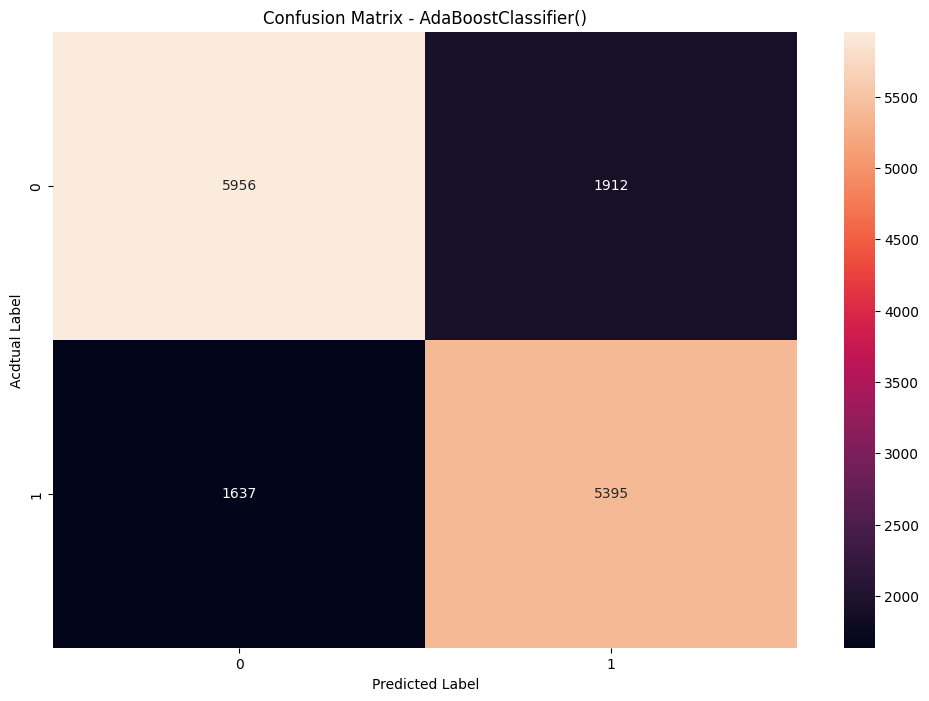

In [ ]:
predict(adaboost)

Accuracy: 75.77%
Precision: 73.62%
Recall: 75.84%
F1_Score: 74.71%


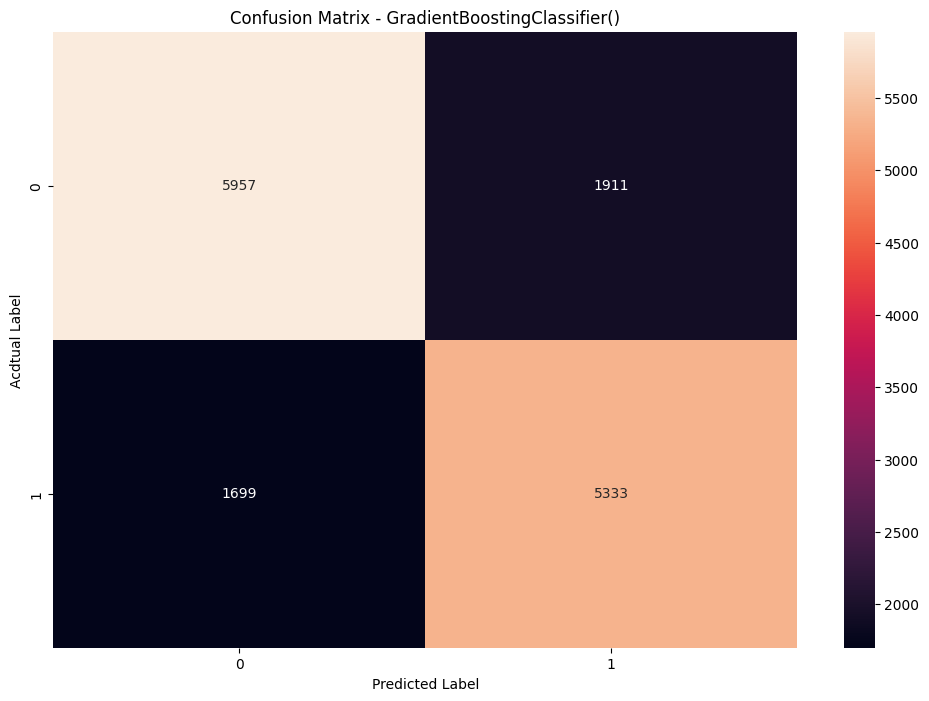

In [ ]:
predict(gradientboosting)

Accuracy: 75.22%
Precision: 72.63%
Recall: 76.21%
F1_Score: 74.38%


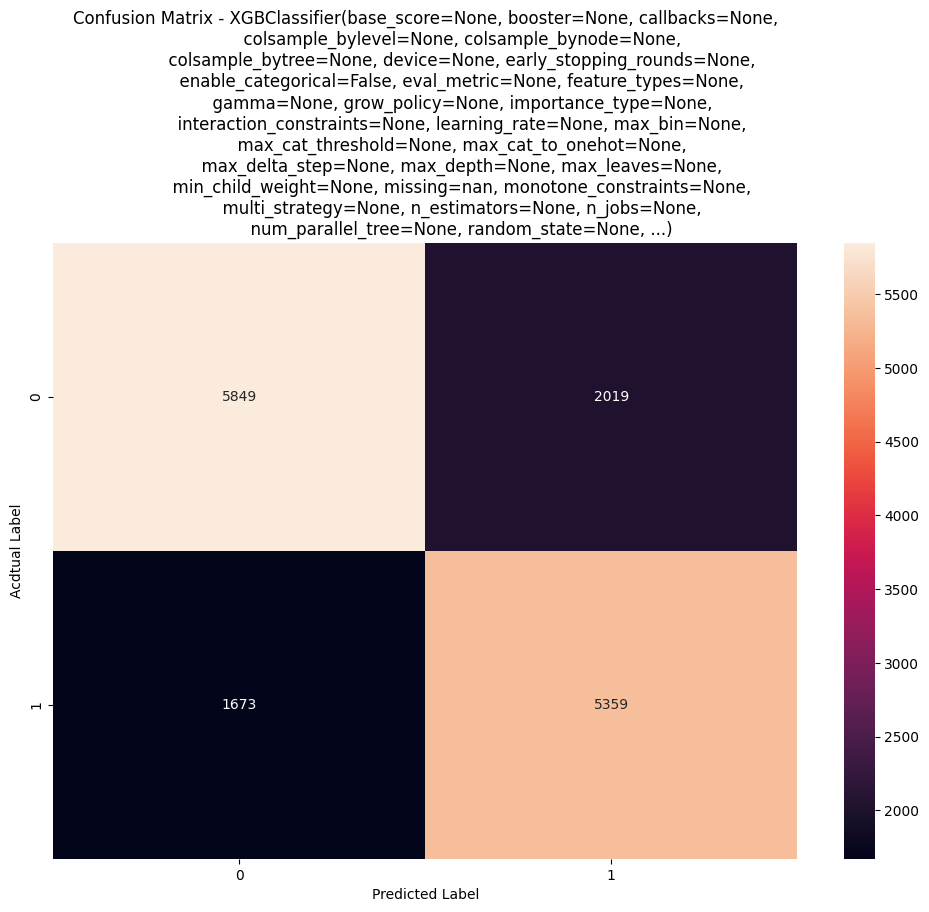

In [ ]:
predict(xgboost)

Accuracy: 75.44%
Precision: 74.38%
Recall: 73.17%
F1_Score: 73.77%


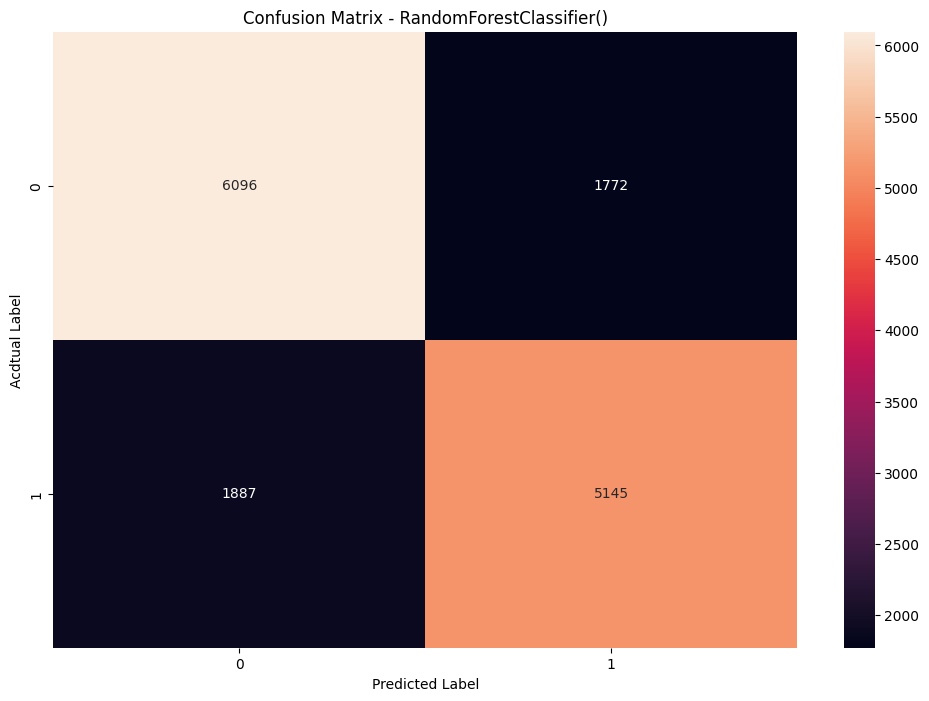

In [ ]:
predict(randomforest)

Accuracy: 68.68%
Precision: 63.04%
Recall: 81.33%
F1_Score: 71.03%


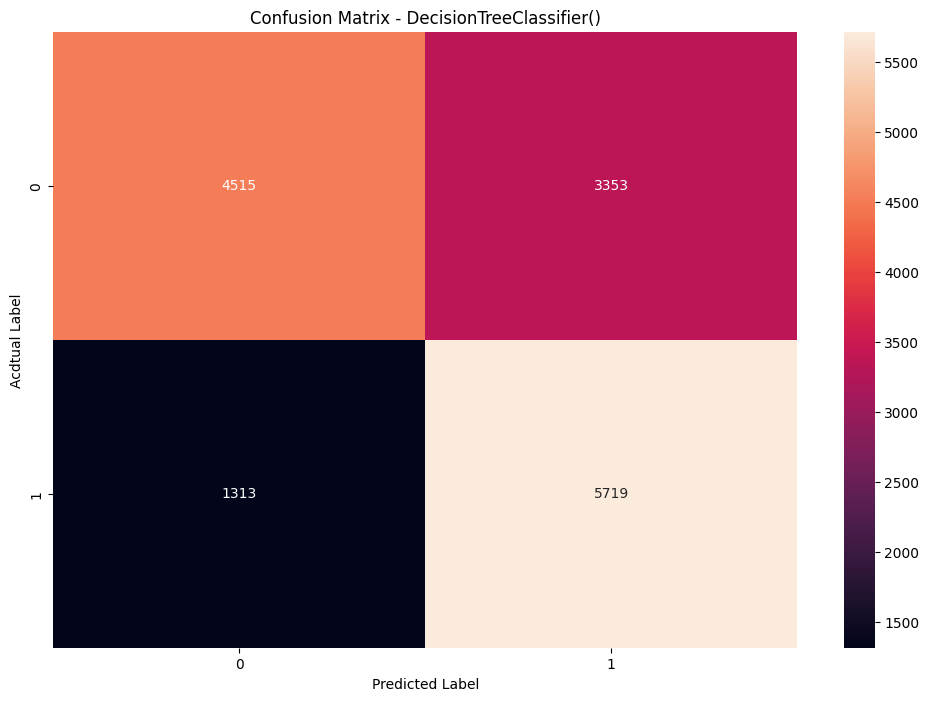

In [ ]:
predict(decisiontree)

In [ ]:
kf = StratifiedKFold(n_splits=5, shuffle=False)
SMOTETomek_pipeline = make_pipeline(SMOTETomek(tomek=TomekLinks(sampling_strategy='majority')), 
                              RandomForestClassifier(n_estimators=50, max_depth=6, random_state=13))

SMOTETomek_rf = SMOTETomek_pipeline
SMOTETomek_rf.fit(X_train, y_train)
y_pred = SMOTETomek_rf.predict(x_test)

cm = confusion_matrix(y_test, y_pred)

SMOTETomek_rf_Recall = recall_score(y_test, y_pred)
SMOTETomek_rf_Precision = precision_score(y_test, y_pred)
SMOTETomek_rf_f1 = f1_score(y_test, y_pred)
SMOTETomek_rf_accuracy = accuracy_score(y_test, y_pred)
ndf = [(SMOTETomek_rf_Recall, SMOTETomek_rf_Precision, SMOTETomek_rf_f1, SMOTETomek_rf_accuracy)]

SMOTETomek_rf_score = pd.DataFrame(data = ndf, columns=['Recall','Precision','F1 Score', 'Accuracy'])
SMOTETomek_rf_score.insert(0, 'Random Forest with', 'SMOTE + Tomek')
SMOTETomek_rf_score

,Random Forest with,Recall,Precision,F1 Score,Accuracy
0,SMOTE + Tomek,0.874716,0.655338,0.7493,0.723758


# voting classifier

In [ ]:
x_scaled = X_train
log_clf = LogisticRegression()
svc_clf = SVC()
knn_clf = KNeighborsClassifier()
dt_clf = DecisionTreeClassifier()
rf_clf = RandomForestClassifier()
ada_clf = AdaBoostClassifier()
for clf in [log_clf, svc_clf, ada_clf, dt_clf, rf_clf]:
    clf.fit(X_train, y_train)
    
    pred = clf.predict(x_test)
    
    print(clf.__class__.__name__, " ", accuracy_score(y_test,pred))

LogisticRegression   0.7295302013422819
SVC   0.7486577181208054
AdaBoostClassifier   0.7633557046979865
DecisionTreeClassifier   0.6657046979865772
RandomForestClassifier   0.7524161073825504


In [ ]:
voting_clf =VotingClassifier([('lgclf',log_clf),('svc',svc_clf),('ada',ada_clf),('dt',dt_clf),('rf',rf_clf)])

voting_clf.fit(X_train,y_train)

y_pred = voting_clf.predict(x_test)
print("acuracy: ",accuracy_score(y_test,y_pred))
x_train_scaled,x_test_scaled,y_train_scaled,y_test_scaled = train_test_split(X_train,y_train,test_size=0.25,random_state=42)
print("training shape: ",x_train_scaled.shape)
print("testing shape: ",x_test_scaled.shape)
for clf in [log_clf, svc_clf, knn_clf, dt_clf, rf_clf]:
    clf.fit(x_train_scaled, y_train_scaled)
    
    pred = clf.predict(x_test_scaled)
    
    print(clf.__class__.__name__, " ", accuracy_score(y_test,pred))
    
voting_clf =VotingClassifier([('lgclf',log_clf),('svc',svc_clf),('knn',knn_clf),('dt',dt_clf),('rf',rf_clf)])

voting_clf.fit(x_train_scaled,y_train_scaled)

y_pred = voting_clf.predict(x_test_scaled)
print("acuracy: ",accuracy_score(y_test_scaled,y_pred))

acuracy:  0.7470469798657718
training shape:  (44698, 22)
testing shape:  (14900, 22)
LogisticRegression   0.5033557046979866
SVC   0.4997986577181208
KNeighborsClassifier   0.4923489932885906
DecisionTreeClassifier   0.5035570469798658
RandomForestClassifier   0.49899328859060404
acuracy:  0.7435570469798658


## HYPERPARAMETER TUNING

In [ ]:
param_grid = { 
    'n_estimators': [25, 50, 100, 150], 
    'max_features': ['sqrt', 'log2', None], 
    'max_depth': [3, 6, 9], 
    'max_leaf_nodes': [3, 6, 9], 
} 
grid_search = GridSearchCV(RandomForestClassifier(), 
                           param_grid=param_grid) 
grid_search.fit(X_train, y_train) 
print(grid_search.best_estimator_) 

RandomForestClassifier(max_depth=9, max_features='log2', max_leaf_nodes=9)


In [ ]:
model_grid = RandomForestClassifier(max_depth=9, max_features='log2', max_leaf_nodes=9,
                       n_estimators=150)
model_grid.fit(X_train, y_train) 
randomforest.fit(X_train, y_train) 
y_pred_grid = randomforest.predict(x_test) 
print(classification_report(y_pred_grid, y_test)) 

              precision    recall  f1-score   support

           0       0.75      0.77      0.76      7717
           1       0.75      0.73      0.74      7183

    accuracy                           0.75     14900
   macro avg       0.75      0.75      0.75     14900
weighted avg       0.75      0.75      0.75     14900

